<a href="https://colab.research.google.com/github/Nikhil5566/Data-Science-Portfolio-Projects/blob/main/Buy%20Now%2C%20Pay%20Later%20(BNPL)%20Dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Buy Now, Pay Later (BNPL) Dataset

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
import warnings
warnings.filterwarnings('ignore')

# Dataset Analysis & Key Insights

### **1. The Dataset Overview**
We analyzed a synthesized **Buy Now, Pay Later (BNPL) dataset** containing **50,000 transactions**. The data provides a 360-degree view of the lending process, capturing three distinct dimensions:
*   **Customer Demographics:** Age, Gender, and Annual Income.
*   **Financial Health:** Credit Score.
*   **Transaction Details:** Purchase Category (e.g., Electronics, Fashion), Purchase Amount, and the BNPL Provider used (e.g., Klarna, Affirm).

The primary objective was to understand **Repayment Behavior**: specifically, distinguishing between customers who pay on time versus those who pay late or default.

---

### **2. Key Insights: What Drives Risk?**
Through statistical testing (Chi-Square, ANOVA) and machine learning (Random Forest, Neural Networks), several clear patterns emerged:

#### **A. Financial Fundamentals are King**
The most powerful predictors of repayment behavior are, unsurprisingly, **Annual Income** and **Credit Score**. Our ANOVA tests showed massive statistical differences here. Customers who default have significantly lower credit scores and incomes compared to those who pay on time. This confirms that despite the "tech" wrapper of BNPL, traditional creditworthiness metrics remain the gold standard for risk prediction.

#### **B. Platform and Gender Neutrality**
One of the most interesting findings is what *doesn't* matter.
*   **BNPL Provider:** There is **no statistically significant difference** in default rates across the different providers (Klarna, Afterpay, Affirm, Sezzle). This suggests that the risk lies entirely with the borrower, not the specific platform's user base.
*   **Gender:** Similarly, gender has no impact on the likelihood of repayment. Risk is gender-neutral.

#### **C. The "What" Matters**
Unlike gender, **Purchase Category** *does* have a significant relationship with repayment. The type of item being financed (e.g., essential Groceries vs. discretionary Travel or Electronics) correlates with the outcome. This implies that *intent* and *necessity* of the purchase are subtle indicators of financial stability.

#### **D. Model Predictability**
Our Neural Network achieved an accuracy of approximately **75%**. This is a solid baseline, indicating that while our current variables (Income, Score, Age) capture the majority of the risk signal, about 25% of the behavior is driven by unobserved factors—likely variables like debt-to-income ratio, employment status, or external economic shocks that are not present in this dataset.

In [4]:
# Installing Kaggle API
!pip install -q kaggle

# Uploading kaggle.json
from google.colab import files
files.upload()

# Moving kaggle.json to ~/.kaggle/
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# Downloading the dataset using Kaggle API
!kaggle datasets download -d bhanageviraj/buy-now-pay-later-bnpl-dataset

# Unziping the downloaded file
!unzip buy-now-pay-later-bnpl-dataset.zip

Saving kaggle.json to kaggle.json
Dataset URL: https://www.kaggle.com/datasets/bhanageviraj/buy-now-pay-later-bnpl-dataset
License(s): apache-2.0
  0% 0.00/1.68M [00:00<?, ?B/s]
100% 1.68M/1.68M [00:00<00:00, 812MB/s]
Archive:  buy-now-pay-later-bnpl-dataset.zip
  inflating: bnpl_dataset.csv        


# Data Inspection

In [5]:
df = pd.read_csv('bnpl_dataset.csv')
df.head(11)

,Transaction_ID,Customer_Age,Gender,Annual_Income,Credit_Score,Purchase_Category,BNPL_Provider,Purchase_Amount,Repayment_Status
0,6cbfd4e5-8e91-4a7b-8a14-e3dfa86a3359,56,Male,32293,353,Beauty,Sezzle,249,Defaulted
1,863e8aa6-847e-4ae0-b96b-65241f3450a2,46,Male,72774,354,Groceries,Affirm,188,Paid On Time
2,a24efee2-16f2-42dc-a0e7-6df4960df0b8,32,Male,82207,630,Travel,Sezzle,1610,Paid On Time
3,bbad847a-a92f-4766-ba3f-98b9b199b4cf,60,Male,92498,470,Fashion,Sezzle,120,Paid On Time
4,3f1b1928-09ca-4d06-8ec3-4efd3468d0ec,25,Male,32060,502,Travel,Klarna,1849,Paid On Time
5,f99db9dc-9e5c-40d1-918a-ecd3469e8c17,38,Female,94833,779,Travel,Klarna,1112,Paid On Time
6,085eae6d-ec9e-4ffd-9d8e-f7629c6db760,56,Female,89772,403,Travel,Klarna,418,Paid On Time
7,1d9eb495-215e-415e-8b2d-411be80398ef,36,Male,82341,731,Travel,Klarna,2117,Paid On Time
8,71a12b8c-b969-432d-9470-4eb4cb89a066,40,Female,80517,669,Home & Furniture,Sezzle,286,Paid On Time
9,f8fd5853-7121-4ee4-aec8-8559b8802bf4,28,Female,108929,359,Beauty,Klarna,244,Defaulted


In [4]:
df.tail(11)

,Transaction_ID,Customer_Age,Gender,Annual_Income,Credit_Score,Purchase_Category,BNPL_Provider,Purchase_Amount,Repayment_Status
49989,084bbccc-4ece-4467-8dbe-78ae17e723eb,35,Male,103255,637,Groceries,Affirm,186,Paid On Time
49990,e707fcd1-2bd7-4fee-8b08-b8dbf56e0c70,60,Female,49975,751,Beauty,Sezzle,20,Paid On Time
49991,2b12c596-9970-4a8b-a9ae-69e3cf21d311,59,Female,95316,443,Electronics,Afterpay,706,Paid On Time
49992,7cd00a2e-f6ca-4ef9-ab56-5c3913fbc295,27,Male,72644,479,Home & Furniture,Afterpay,158,Defaulted
49993,20c2ac03-278e-49ff-8a68-42740f344591,18,Female,105233,832,Home & Furniture,Afterpay,187,Paid On Time
49994,700118dc-1cb6-4c6e-b3d2-032e0678f980,37,Non-Binary,109939,405,Home & Furniture,Afterpay,142,Paid On Time
49995,5809f3a6-29c5-40f8-9452-f835ecc1f8f0,60,Male,78276,543,Groceries,Klarna,262,Paid On Time
49996,88c98bc1-fd0c-43b8-b079-73826fdc64f2,46,Female,40989,828,Fashion,Sezzle,263,Paid On Time
49997,a50da40e-f7d0-49f3-b316-2ff8f09f117d,19,Female,64502,648,Travel,Affirm,1777,Paid On Time
49998,e623faa5-4c8f-44f1-9a8c-4f8d8a23ffdf,43,Male,44026,481,Travel,Afterpay,1648,Paid On Time


In [5]:
df.shape

(50000, 9)

In [6]:
df.columns

Index(['Transaction_ID', 'Customer_Age', 'Gender', 'Annual_Income',
       'Credit_Score', 'Purchase_Category', 'BNPL_Provider', 'Purchase_Amount',
       'Repayment_Status'],
      dtype='object')

In [7]:
df.dtypes

,0
Transaction_ID,object
Customer_Age,int64
Gender,object
Annual_Income,int64
Credit_Score,int64
Purchase_Category,object
BNPL_Provider,object
Purchase_Amount,int64
Repayment_Status,object


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 9 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Transaction_ID     50000 non-null  object
 1   Customer_Age       50000 non-null  int64 
 2   Gender             50000 non-null  object
 3   Annual_Income      50000 non-null  int64 
 4   Credit_Score       50000 non-null  int64 
 5   Purchase_Category  50000 non-null  object
 6   BNPL_Provider      50000 non-null  object
 7   Purchase_Amount    50000 non-null  int64 
 8   Repayment_Status   50000 non-null  object
dtypes: int64(4), object(5)
memory usage: 3.4+ MB


In [10]:
df.describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Transaction_ID,50000,50000,9e649801-b936-4cc5-984b-48c8fdcdd91c,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Customer_Age,50000.0,NaN,NaN,NaN,40.97924,13.528733,18.0,29.0,41.0,53.0,64.0
Gender,50000,3,Female,24139,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Annual_Income,50000.0,NaN,NaN,NaN,69980.8602,28923.444012,20000.0,44915.5,70071.5,95262.25,119998.0
Credit_Score,50000.0,NaN,NaN,NaN,573.5693,158.853766,300.0,435.0,572.0,711.0,849.0
Purchase_Category,50000,6,Travel,8401,NaN,NaN,NaN,NaN,NaN,NaN,NaN
BNPL_Provider,50000,4,Klarna,12545,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Purchase_Amount,50000.0,NaN,NaN,NaN,563.22198,706.078491,20.0,124.0,229.0,785.0,2999.0
Repayment_Status,50000,3,Paid On Time,37612,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [6]:
df.isnull().sum()

,0
Transaction_ID,0
Customer_Age,0
Gender,0
Annual_Income,0
Credit_Score,0
Purchase_Category,0
BNPL_Provider,0
Purchase_Amount,0
Repayment_Status,0


In [11]:
df.duplicated().sum()

np.int64(0)

# Multivariate Analysis


Analyzing relationships with Hue: Gender...


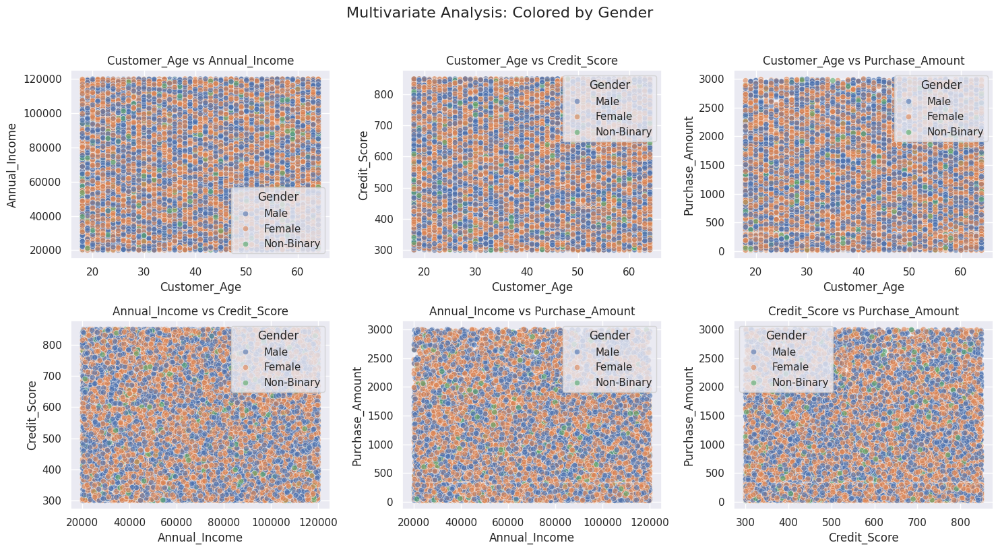


Analyzing relationships with Hue: Purchase_Category...


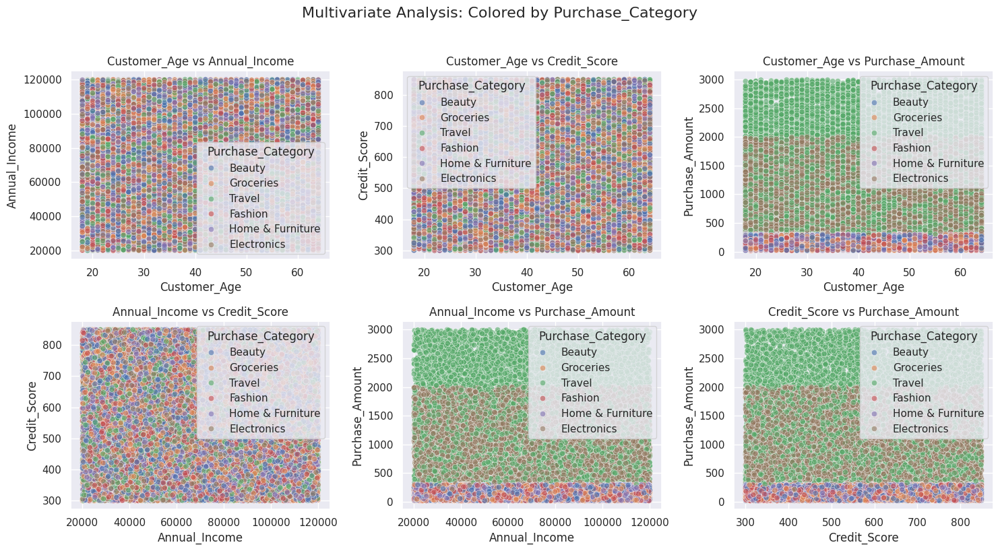


Analyzing relationships with Hue: BNPL_Provider...


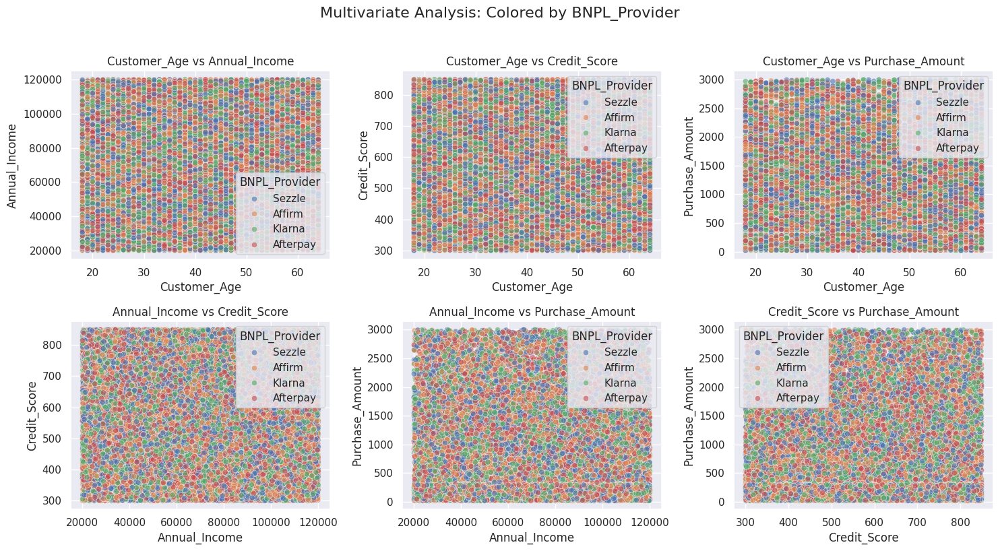


Analyzing relationships with Hue: Repayment_Status...


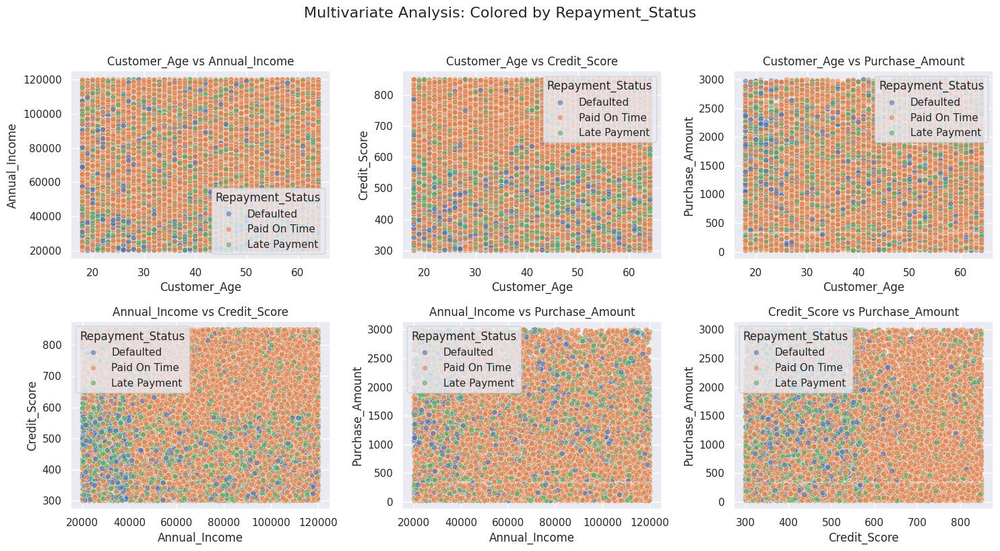

In [7]:
import itertools
import math

# --- Multivariate Analysis: Numerical Pairs with Categorical Hue ---

# 1. Identifying valid columns
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()
# Filtering categorical columns to those with few unique values for clear legends (e.g., < 10)
categorical_cols = [c for c in df.select_dtypes(include='object').columns if df[c].nunique() < 10]

# Generating pairs of numerical columns to plot
num_pairs = list(itertools.combinations(numerical_cols, 2))

if len(numerical_cols) > 1 and len(categorical_cols) > 0:
    # OUTER LOOP: Iterating through each categorical variable to use as the 'Hue'
    for cat_col in categorical_cols:
        print(f"\nAnalyzing relationships with Hue: {cat_col}...")

        # Defining grid size for the inner loop (numerical pairs)
        num_plots = len(num_pairs)
        num_cols_plot = 3
        num_rows_plot = math.ceil(num_plots / num_cols_plot)

        # Creating figure
        fig, axes = plt.subplots(num_rows_plot, num_cols_plot, figsize=(15, 4 * num_rows_plot))
        if num_plots > 1:
             axes = axes.flatten()
        else:
             axes = [axes]

        # INNER LOOP: Iterating through numerical pairs
        for i, (num1, num2) in enumerate(num_pairs):
            sns.scatterplot(data=df, x=num1, y=num2, hue=cat_col, ax=axes[i], alpha=0.6)
            axes[i].set_title(f'{num1} vs {num2}')

        # Hiding unused subplots
        for j in range(i + 1, len(axes)):
            axes[j].axis('off')

        plt.suptitle(f'Multivariate Analysis: Colored by {cat_col}', y=1.02, fontsize=16)
        plt.tight_layout()
        plt.show()
        print("="*80)
else:
    print("Not enough data for multivariate scatter analysis (need >1 numerical and >0 categorical columns).")

# Univariate Analysis

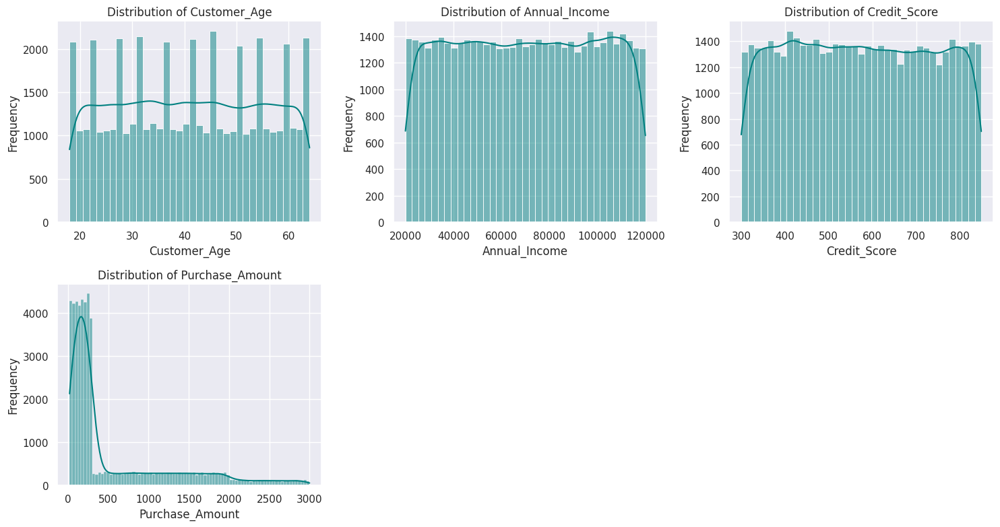

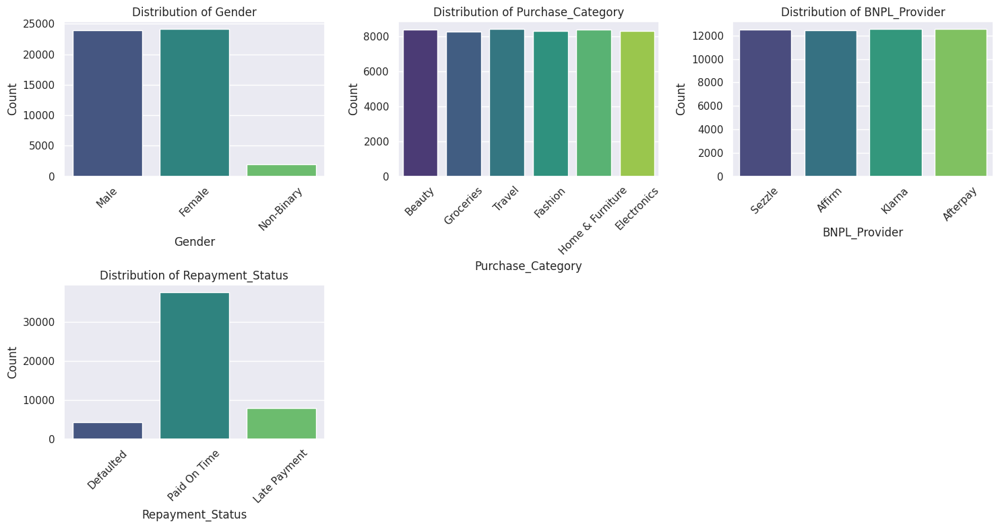

--- Categorical Value Counts ---

Value counts for Gender:
Gender
Female        24139
Male          23952
Non-Binary     1909
Name: count, dtype: int64

Value counts for Purchase_Category:
Purchase_Category
Travel              8401
Beauty              8381
Home & Furniture    8368
Fashion             8307
Electronics         8303
Groceries           8240
Name: count, dtype: int64

Value counts for BNPL_Provider:
BNPL_Provider
Klarna      12545
Afterpay    12536
Sezzle      12501
Affirm      12418
Name: count, dtype: int64

Value counts for Repayment_Status:
Repayment_Status
Paid On Time    37612
Late Payment     8009
Defaulted        4379
Name: count, dtype: int64


In [7]:
import math

# --- 1. Numerical Columns (Histograms in a Grid) ---
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

if len(numerical_cols) > 0:
    # Defining grid size
    num_plots = len(numerical_cols)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    # Creating figure and axes
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))
    axes = axes.flatten()

    # Iterating and plot
    for i, col in enumerate(numerical_cols):
        sns.histplot(data=df, x=col, kde=True, ax=axes[i], color='teal') # Added color
        axes[i].set_title(f'Distribution of {col}')
        axes[i].set_xlabel(col)
        axes[i].set_ylabel('Frequency')

    # Hiding any unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("No numerical columns found.")


# --- 2. Categorical Columns (Countplots in a Grid) ---
# Filtering out columns with too many unique values (like IDs) to avoid messy plots
categorical_cols = [c for c in df.select_dtypes(include='object').columns if df[c].nunique() < 20]

if len(categorical_cols) > 0:
    # Defining grid size
    num_plots = len(categorical_cols)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    # Creating figure and axes
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))
    axes = axes.flatten()

    # Iterating and plot
    for i, col in enumerate(categorical_cols):
        sns.countplot(data=df, x=col, ax=axes[i], palette='viridis', hue=col, legend=False) # Added palette
        axes[i].set_title(f'Distribution of {col}')
        axes[i].set_xlabel(col)
        axes[i].set_ylabel('Count')
        axes[i].tick_params(axis='x', rotation=45)

    # Hiding unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

     # --- 3. Value Counts (Text Output) ---
    print("--- Categorical Value Counts ---")
    for col in categorical_cols:
        print(f"\nValue counts for {col}:")
        print(df[col].value_counts())
else:
    print("No categorical columns found (or all have high cardinality).")

# Bivariate Analysis

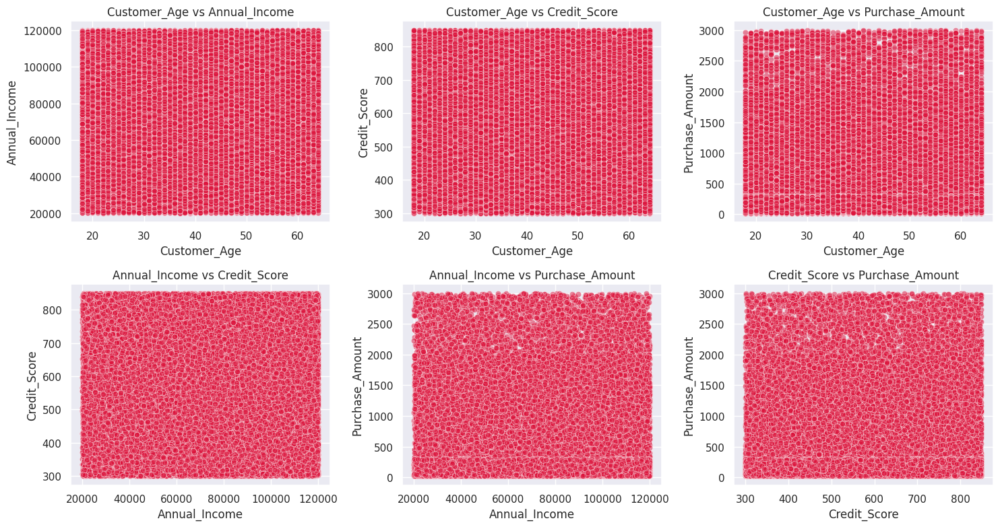

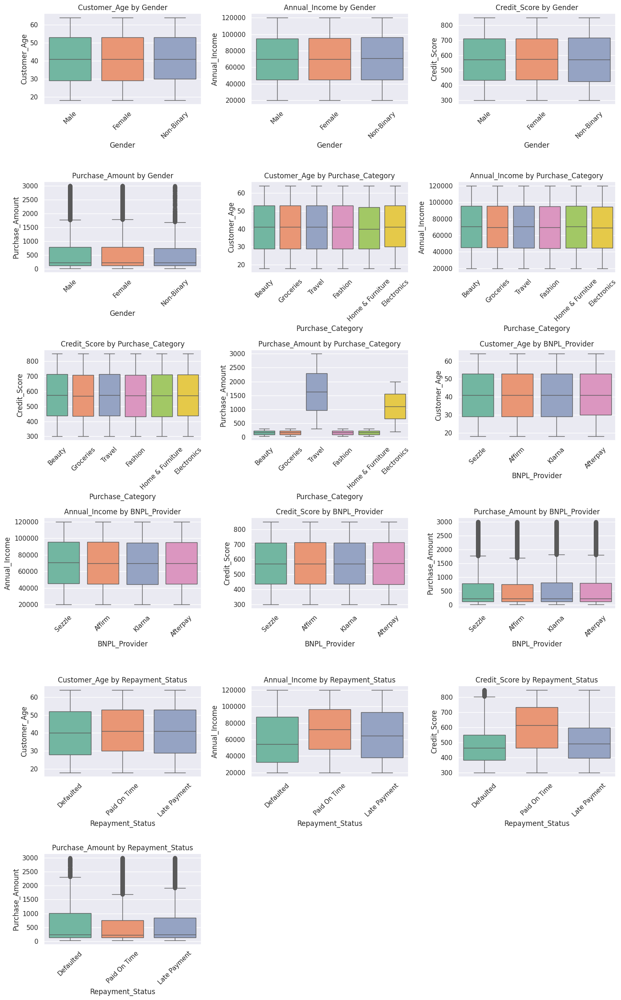

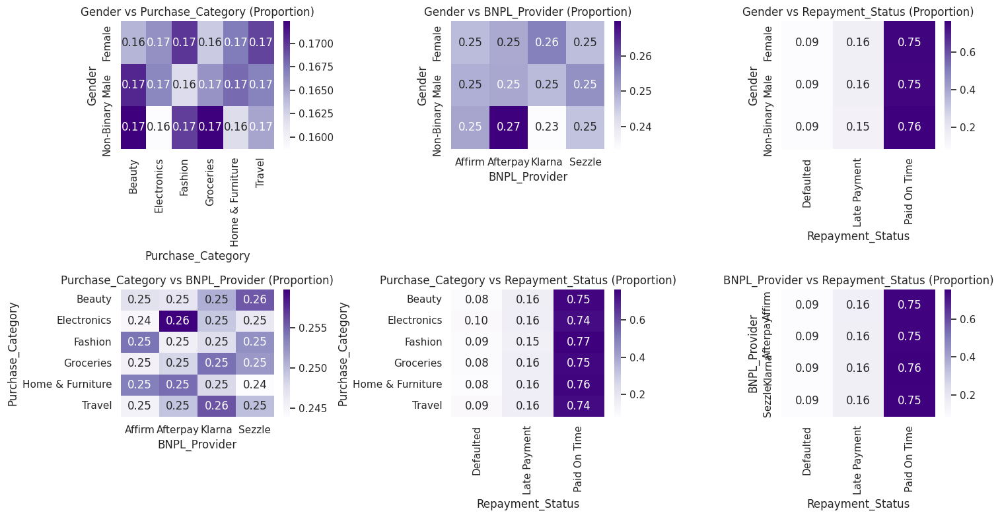

In [8]:
import itertools

# --- 1. Numerical-Numerical Relationships (Scatter Plots) ---
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Generating all unique pairs of numerical columns
num_pairs = list(itertools.combinations(numerical_cols, 2))

if len(num_pairs) > 0:
    # Defining grid size
    num_plots = len(num_pairs)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    # Creating figure and axes
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))

    if num_plots == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    # Iterating through pairs and plot
    for i, (col1, col2) in enumerate(num_pairs):
        sns.scatterplot(data=df, x=col1, y=col2, ax=axes[i], alpha=0.5, color='crimson') # Added color
        axes[i].set_title(f'{col1} vs {col2}')
        axes[i].set_xlabel(col1)
        axes[i].set_ylabel(col2)

    # Hiding unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("Not enough numerical columns for scatter plots.")


# --- 2. Categorical-Numerical Relationships (Box Plots) ---
# Excluding high cardinality columns
categorical_cols = [c for c in df.select_dtypes(include='object').columns if df[c].nunique() < 20]
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Generating all pairs of (Categorical, Numerical)
cat_num_pairs = list(itertools.product(categorical_cols, numerical_cols))

if len(cat_num_pairs) > 0:
    # Defining grid size
    num_plots = len(cat_num_pairs)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    # Creating figure and axes
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))

    if num_plots == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    # Iterating through pairs and plot
    for i, (cat_col, num_col) in enumerate(cat_num_pairs):
        sns.boxplot(data=df, x=cat_col, y=num_col, ax=axes[i], palette='Set2', hue=cat_col, legend=False)
        axes[i].set_title(f'{num_col} by {cat_col}')
        axes[i].set_xlabel(cat_col)
        axes[i].set_ylabel(num_col)
        axes[i].tick_params(axis='x', rotation=45)

    # Hiding unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("No categorical-numerical pairs found.")


# --- 3. Categorical-Categorical Relationships (Heatmaps) ---
# Generating pairs of categorical columns
cat_pairs = list(itertools.combinations(categorical_cols, 2))

if len(cat_pairs) > 0:
    num_plots = len(cat_pairs)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))

    if num_plots == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    for i, (col1, col2) in enumerate(cat_pairs):
        # Creating a cross-tabulation
        crosstab = pd.crosstab(df[col1], df[col2], normalize='index')
        sns.heatmap(crosstab, annot=True, fmt='.2f', cmap='Purples', ax=axes[i])
        axes[i].set_title(f'{col1} vs {col2} (Proportion)')

    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

# Pairplot

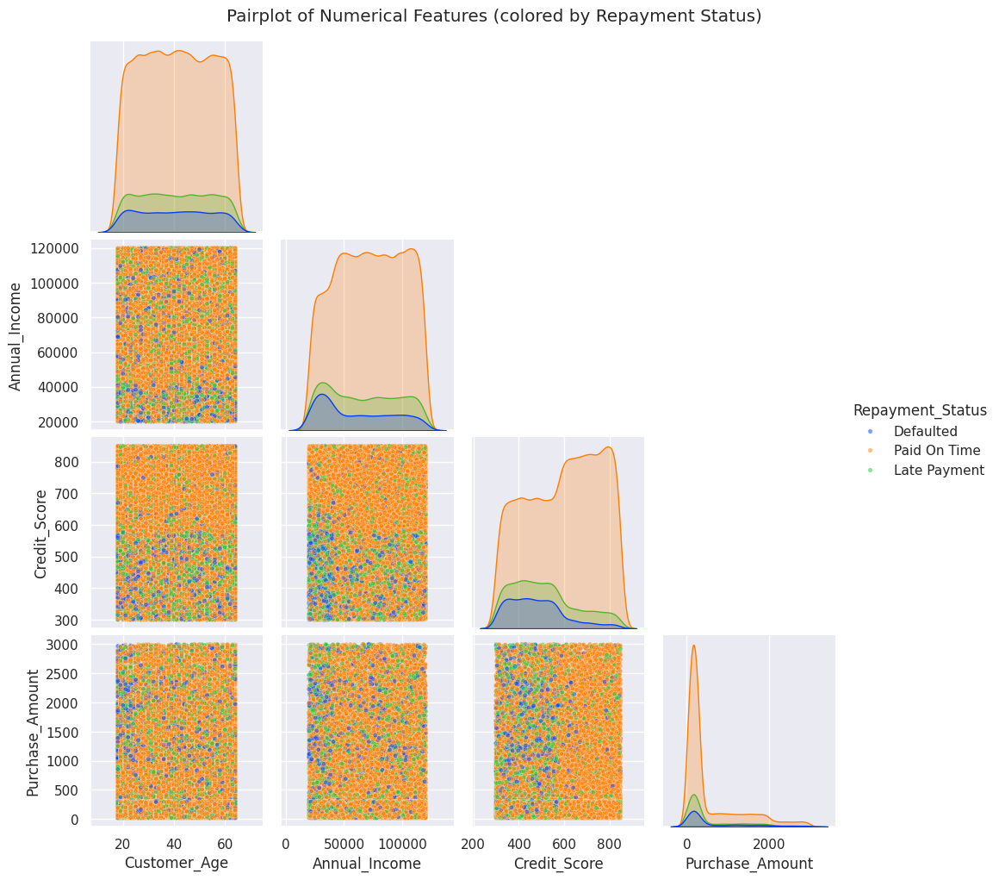

In [8]:
# Selecting numerical columns
vars_to_plot = df.select_dtypes(include=np.number).columns.tolist()

# Checking if Repayment_Status exists to use as hue
hue_col = 'Repayment_Status' if 'Repayment_Status' in df.columns else None

# Creating the pairplot
sns.pairplot(
    df,
    vars=vars_to_plot,
    hue=hue_col,
    corner=True,
    palette='bright',
    diag_kind='kde',
    plot_kws={'alpha': 0.5, 's': 15}
)

plt.suptitle('Pairplot of Numerical Features (colored by Repayment Status)', y=1.02)
plt.show()

# Heatmap

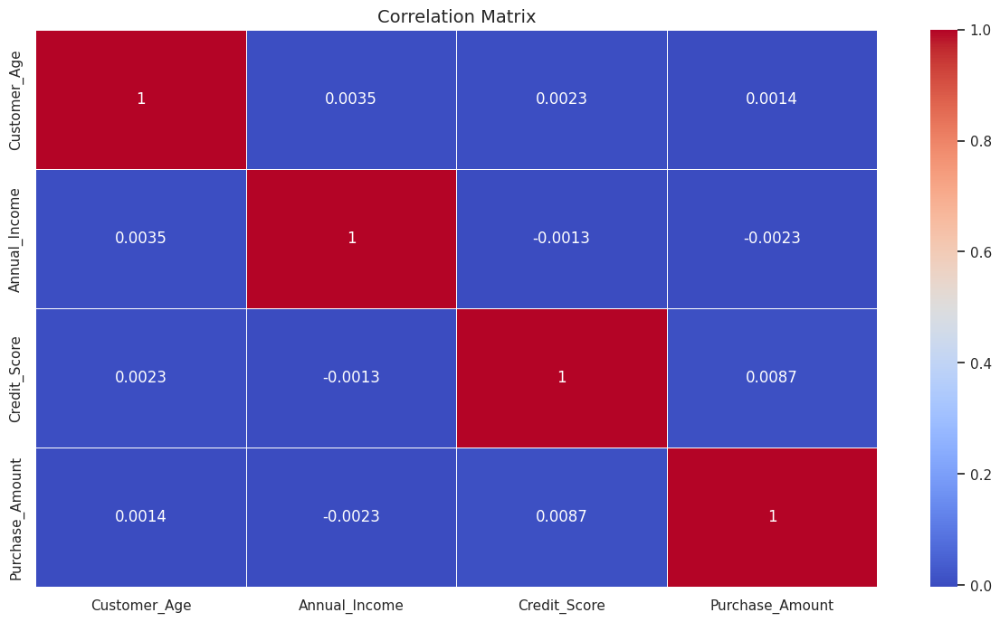

In [10]:
plt.figure(figsize=(15, 8))
sns.heatmap(df.corr(numeric_only = True), annot=True, cmap="coolwarm", linewidths=0.5)
plt.title("Correlation Matrix", fontsize=14)
plt.show()

# Statitical Analysis

## Chi-Square Tests

Chi-Square tests of independence between 'Repayment_Status' and selected categorical variables.


In [11]:
from scipy.stats import chi2_contingency

# List of categorical variables to analyze
cat_vars = ['Gender', 'BNPL_Provider', 'Purchase_Category']

print("Chi-Square Tests of Independence with Repayment_Status:\n")

for var in cat_vars:
    # Create contingency table
    contingency_table = pd.crosstab(df[var], df['Repayment_Status'])

    # Perform Chi-Square test
    chi2, p, dof, expected = chi2_contingency(contingency_table)

    # Print results
    print(f"--- {var} vs Repayment_Status ---")
    print(f"Chi-Square Statistic: {chi2:.4f}")
    print(f"P-value: {p:.4g}")

    # Interpretation
    if p < 0.05:
        print("Result: Statistically Significant Relationship (Reject H0)")
    else:
        print("Result: No Statistically Significant Relationship (Fail to reject H0)")
    print("\n")

Chi-Square Tests of Independence with Repayment_Status:

--- Gender vs Repayment_Status ---
Chi-Square Statistic: 3.2638
P-value: 0.5147
Result: No Statistically Significant Relationship (Fail to reject H0)


--- BNPL_Provider vs Repayment_Status ---
Chi-Square Statistic: 3.0378
P-value: 0.8041
Result: No Statistically Significant Relationship (Fail to reject H0)


--- Purchase_Category vs Repayment_Status ---
Chi-Square Statistic: 38.9071
P-value: 2.636e-05
Result: Statistically Significant Relationship (Reject H0)




## ANOVA Tests

One-Way ANOVA tests to compare the means of numerical features (Credit_Score, Annual_Income, Purchase_Amount) across different Repayment_Status groups.


In [12]:
from scipy.stats import f_oneway

# Listing of numerical variables to analyze
numerical_vars = ['Credit_Score', 'Annual_Income', 'Purchase_Amount']

print("One-Way ANOVA Tests across Repayment_Status groups:\n")

# Getting unique groups for Repayment_Status to ensure consistent ordering if needed,
# though f_oneway treats them as independent samples.
groups_labels = df['Repayment_Status'].unique()

for var in numerical_vars:
    # Extracting data for each group
    group_data = [df[df['Repayment_Status'] == label][var] for label in groups_labels]

    # Performing One-Way ANOVA
    f_stat, p_val = f_oneway(*group_data)

    # Printing results
    print(f"--- {var} across Repayment_Status ---")
    print(f"F-statistic: {f_stat:.4f}")
    print(f"P-value: {p_val:.4g}")

    # Interpretation
    if p_val < 0.05:
        print("Result: Statistically Significant Difference in Means (Reject H0)")
    else:
        print("Result: No Statistically Significant Difference in Means (Fail to reject H0)")
    print("\n")

One-Way ANOVA Tests across Repayment_Status groups:

--- Credit_Score across Repayment_Status ---
F-statistic: 1892.6559
P-value: 0
Result: Statistically Significant Difference in Means (Reject H0)


--- Annual_Income across Repayment_Status ---
F-statistic: 396.2365
P-value: 1.846e-171
Result: Statistically Significant Difference in Means (Reject H0)


--- Purchase_Amount across Repayment_Status ---
F-statistic: 13.1033
P-value: 2.046e-06
Result: Statistically Significant Difference in Means (Reject H0)




# Checking for Imbalance

Value Counts for Repayment_Status:
 Repayment_Status
Paid On Time    37612
Late Payment     8009
Defaulted        4379
Name: count, dtype: int64

Percentage Distribution for Repayment_Status:
 Repayment_Status
Paid On Time    75.224
Late Payment    16.018
Defaulted        8.758
Name: proportion, dtype: float64


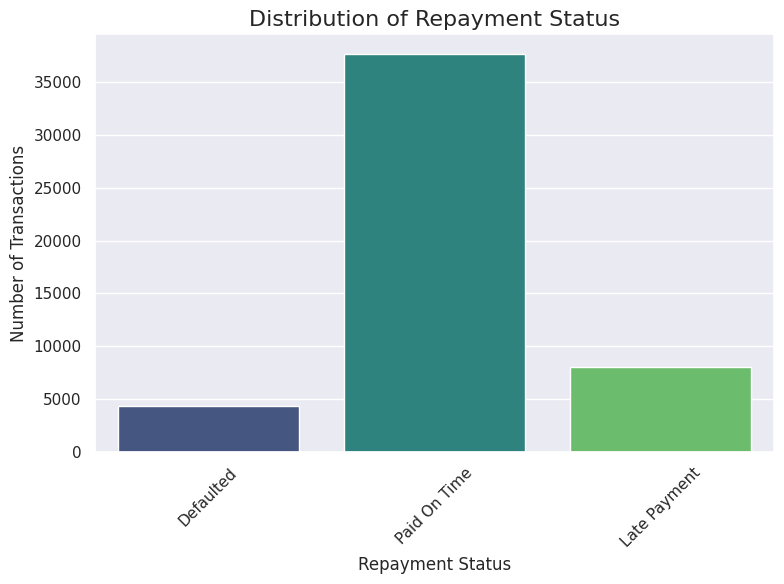

In [9]:
# 1. Calculating the value counts of the Repayment_Status column
repayment_counts = df['Repayment_Status'].value_counts()
print("Value Counts for Repayment_Status:\n", repayment_counts)

# 2. Calculating the percentage distribution of each Repayment_Status
repayment_percentages = df['Repayment_Status'].value_counts(normalize=True) * 100
print("\nPercentage Distribution for Repayment_Status:\n", repayment_percentages)

# 3. Creating a count plot to visualize the distribution
plt.figure(figsize=(8, 6))
sns.countplot(data=df, x='Repayment_Status', palette='viridis', hue='Repayment_Status', legend=False)

# 4. Adding a title to the plot and display it
plt.title('Distribution of Repayment Status', fontsize=16)
plt.xlabel('Repayment Status', fontsize=12)
plt.ylabel('Number of Transactions', fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

## Hyperparameter Tuning with Cross-Validation (Random Forest)

Optimizing the Random Forest Classifier by performing hyperparameter tuning using RandomizedSearchCV with cross-validation to find the best model parameters, considering class imbalance.


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV, StratifiedKFold
from scipy.stats import randint

# 1. Defining hyperparameter distribution for RandomizedSearchCV
param_dist = {
    'n_estimators': randint(100, 500), # Number of trees in the forest
    'max_features': ['sqrt', 'log2'], # Number of features to consider at each split
    'max_depth': randint(10, 110), # Maximum number of levels in tree
    'min_samples_split': randint(2, 10), # Minimum number of samples required to split a node
    'min_samples_leaf': randint(1, 4), # Minimum number of samples required at each leaf node
    'class_weight': ['balanced', None] # Handle class imbalance
}

# 2. Instantiate a RandomForestClassifier
rf_classifier = RandomForestClassifier(random_state=42)

# 3. Initialize StratifiedKFold for cross-validation
# StratifiedKFold ensures that each fold has approximately the same percentage of samples of each target class.
cv_strategy = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# 4. Creating RandomizedSearchCV object
# 'f1_weighted' is chosen as a scoring metric to account for class imbalance
# n_iter=100 specifies the number of parameter settings that are sampled
# n_jobs=-1 uses all available CPU cores
random_search = RandomizedSearchCV(
    estimator=rf_classifier,
    param_distributions=param_dist,
    n_iter=100, # Number of parameter settings that are sampled
    cv=cv_strategy,
    scoring='f1_weighted', # Metric to optimize, good for imbalanced datasets
    verbose=1, # Prints details during the search
    random_state=42,
    n_jobs=-1 # Use all available cores
)

print("Starting Randomized Search for Hyperparameter Tuning...")

# 5. Fitting RandomizedSearchCV to the training data
random_search.fit(X_train, y_train)

print("Randomized Search Complete.")

# 6. Printing the best parameters found
print("\nBest Parameters found:", random_search.best_params_)

# 7. Printing the best score achieved
print("Best F1-weighted Score achieved:", random_search.best_score_)

Starting Randomized Search for Hyperparameter Tuning...
Fitting 5 folds for each of 100 candidates, totalling 500 fits


# Feature Engineering | Machine Leaning

--- 1. DATA PREPARATION (ENCODING) ---
Encoded Transaction_ID: ['000093e2-1f68-4bb8-8dbe-764d52b59dfe', '0000fe21-2c64-4007-b050-66f494168d9b', '00042bcc-1fe3-4695-bf1b-0e83bdfc02f7', '00047296-c543-4ca3-a13c-c35ad133d707', '0004ce18-1b90-4ef2-8f04-8410c930ff45', '0006250d-d483-44b2-94dc-265b50b08a7a', '00085fe1-8dc8-4a72-87ff-d4641d44daac', '0008e65b-a99d-4c21-9056-c9d1f3521823', '000a3cc8-5bcc-4d5f-9a8f-c774dac704cf', '000a6080-6063-42d3-b9f7-8ce72e244b95', '000d7f6d-3291-444e-82be-f781bed4622e', '00122dc0-f00f-4344-a0ec-1c9152c80fd3', '0012d1de-a0fe-48b4-9258-665c653ec789', '0013dbee-c87e-4ca1-9716-402a47ab764c', '001641c3-a476-4b5c-a4a0-ee34c7424d45', '0016f1f8-3f88-4359-a0f1-04ea77e2d731', '001b5265-ab58-4b4e-b089-f9b0da6dd2d1', '001bdaa3-574b-4172-812d-e5d049ccde47', '001c9956-adca-4af6-86df-9838a4a85389', '001ca702-480f-4b06-9d57-dade01fec5de', '001ce663-4498-41d1-b658-aca7cf070caf', '001d05e2-356d-4e22-b0c0-750cc1d53971', '001d43e6-faa1-4ade-b4bf-8778faefa4d0', '00202139-37a6-4

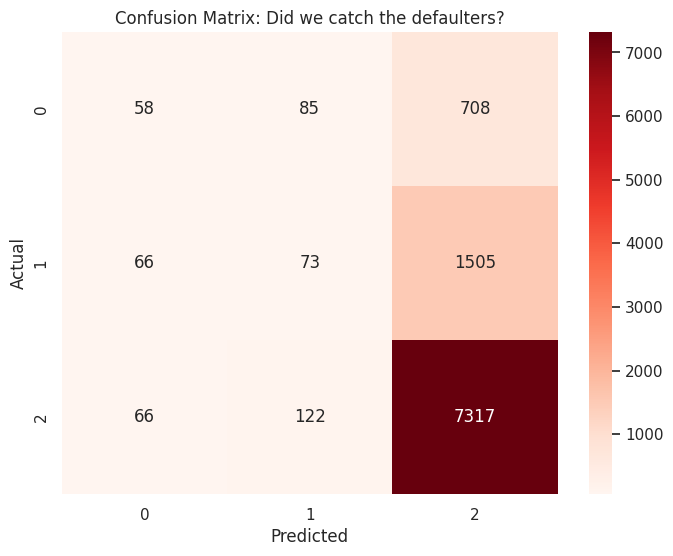

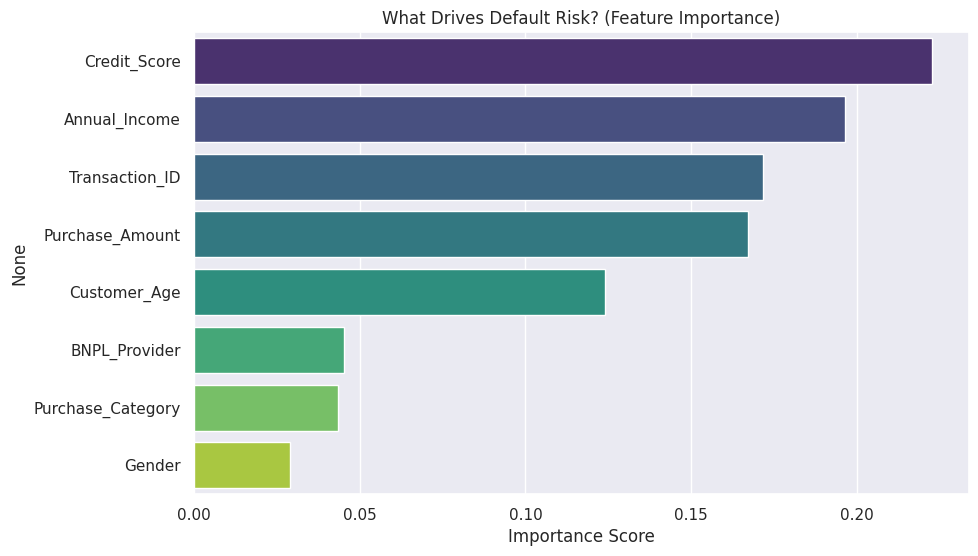

 INSIGHT:
   - If 'Income' or 'Age' is high, demographics drive risk.
   - If 'Transaction_Amount' is high, the loan size is the problem.


In [14]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix

print("--- 1. DATA PREPARATION (ENCODING) ---")
# 1. Identifying Target
# We are assuming 'Repayment_Status' is the target (e.g., 'Paid', 'Defaulted', 'Late')
target_col = 'Repayment_Status'

# 2. Encoding Categorical Features
df_ml = df.copy()
label_encoders = {}

for col in df_ml.select_dtypes(include=['object']).columns:
    le = LabelEncoder()
    df_ml[col] = le.fit_transform(df_ml[col])
    label_encoders[col] = le
    print(f"Encoded {col}: {list(le.classes_)}")

print("\n--- 2. TRAINING THE MODEL (RANDOM FOREST) ---")
# Defining X and y
X = df_ml.drop(columns=[target_col])
y = df_ml[target_col]

# Spliting Data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Training Model
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Predicting
preds = model.predict(X_test)

print("\n--- 3. EVALUATION REPORT ---")
print(classification_report(y_test, preds))

# Confusion Matrix
plt.figure(figsize=(8, 6))
sns.heatmap(confusion_matrix(y_test, preds), annot=True, fmt='d', cmap='Reds')
plt.title('Confusion Matrix: Did we catch the defaulters?')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# Feature Importance
importances = pd.Series(model.feature_importances_, index=X.columns).sort_values(ascending=False)
plt.figure(figsize=(10, 6))
sns.barplot(x=importances.values, y=importances.index, palette='viridis')
plt.title('What Drives Default Risk? (Feature Importance)')
plt.xlabel('Importance Score')
plt.show()

print(" INSIGHT:")
print("   - If 'Income' or 'Age' is high, demographics drive risk.")
print("   - If 'Transaction_Amount' is high, the loan size is the problem.")

# Deep Learning | Neural Network

--- 1. DATA PREPROCESSING FOR NEURAL NETS ---
Variable 'df_ml' missing. Performing encoding on 'df' now...
Data Shape: (40000, 8)

--- 2. BUILDING THE BRAIN (ARCHITECTURE) ---
Detected 3 classes. Using sparse_categorical_crossentropy.

--- 3. TRAINING THE MODEL (THE EPOCHS) ---
Epoch 1/50
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 7s 3ms/step - accuracy: 0.7062 - loss: 0.7983 - val_accuracy: 0.7505 - val_loss: 0.6726
Epoch 2/50
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.7568 - loss: 0.6790 - val_accuracy: 0.7505 - val_loss: 0.6678
Epoch 3/50
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.7502 - loss: 0.6770 - val_accuracy: 0.7505 - val_loss: 0.6644
Epoch 4/50
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.7519 - loss: 0.6754 - val_accuracy: 0.7505 - val_loss: 0.6628
Epoch 5/50
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.7524 - loss: 0.6728 - val_accuracy: 0.7501 - val_loss: 0.6621
Epoch 6/50
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.753

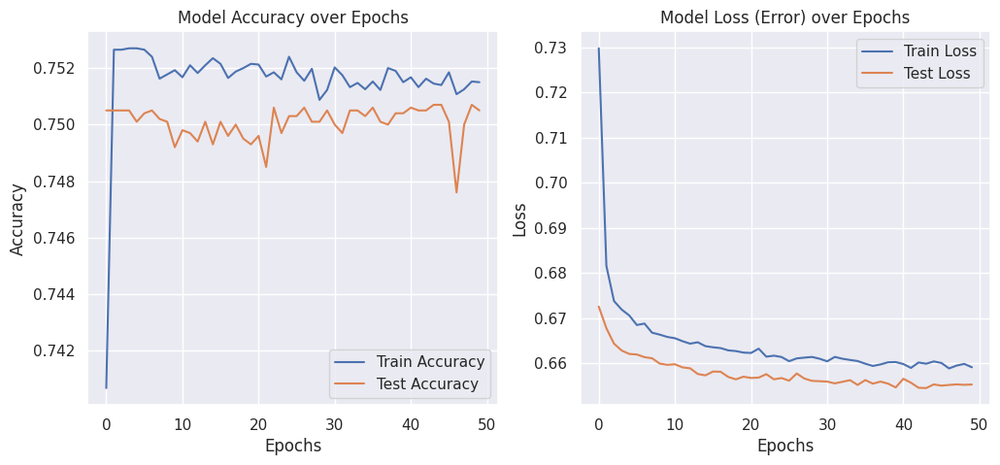

In [6]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split
import pandas as pd
import matplotlib.pyplot as plt

print("--- 1. DATA PREPROCESSING FOR NEURAL NETS ---")

# --- FIX: Ensure df_ml is defined ---
# If the previous cells weren't run, variables might be missing.
if 'df_ml' not in locals():
    print("Variable 'df_ml' missing.")

    # Check if 'df' exists; if not, reload from CSV
    if 'df' not in locals():
        print("Variable 'df' is also missing. Reloading 'bnpl_dataset.csv'...")
        try:
            df = pd.read_csv('bnpl_dataset.csv')
        except FileNotFoundError:
            raise RuntimeError("Dataset not found! Please run the 'Downloading the dataset' cells above.")

    print("Performing encoding on 'df' now...")
    df_ml = df.copy()
    for col in df_ml.select_dtypes(include=['object']).columns:
        le = LabelEncoder()
        df_ml[col] = le.fit_transform(df_ml[col])
# ------------------------------------

# Neural Networks require Scaling (StandardScaler) to work well.

# 1. Preparing Data
# Assuming target is 'Repayment_Status' and we have encoded it to numbers previously
target_col = 'Repayment_Status'

X = df_ml.drop(columns=[target_col])
y = df_ml[target_col]

# 2. Scaleing the Features (Crucial Step!)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 3. Spliting the Data
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

print(f"Data Shape: {X_train.shape}")


print("\n--- 2. BUILDING THE BRAIN (ARCHITECTURE) ---")
# Input Layer -> Hidden Layers -> Output Layer

model = Sequential()

# Input Layer + Hidden Layer 1 (16 Neurons, ReLU activation)
model.add(Dense(16, activation='relu', input_shape=(X_train.shape[1],)))

# Hidden Layer 2 (8 Neurons)
model.add(Dense(8, activation='relu'))

# Dropout Layer (Prevents over-memorizing/overfitting)
model.add(Dropout(0.2))

# Output Layer
# If you have 2 classes (Paid/Default): use 1 neuron + 'sigmoid'
# If you have >2 classes (Paid/Late/Default): use neurons = class_count + 'softmax'
num_classes = len(y.unique())

if num_classes == 2:
    model.add(Dense(1, activation='sigmoid'))
    loss_fn = 'binary_crossentropy'
else:
    model.add(Dense(num_classes, activation='softmax'))
    loss_fn = 'sparse_categorical_crossentropy' # 'sparse' handles integers (0, 1, 2) automatically

print(f"Detected {num_classes} classes. Using {loss_fn}.")

# Compiling the Model
model.compile(optimizer='adam', loss=loss_fn, metrics=['accuracy'])


print("\n--- 3. TRAINING THE MODEL (THE EPOCHS) ---")
history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=50,
    batch_size=32,
    verbose=1
)


print("\n--- 4. VISUALIZING THE LEARNING CURVE ---")
# Did the model get smarter over time?

plt.figure(figsize=(12, 5))

# Plot Accuracy
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Test Accuracy')
plt.title('Model Accuracy over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

# Plot Loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Test Loss')
plt.title('Model Loss (Error) over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Thank You